<a href="https://colab.research.google.com/github/JosephFrancisTribbiani/visualizing_what_convnets_learn/blob/main/visualising_what_convnets_learn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Полезные ссылки:  
https://keras.io/examples/vision/visualizing_what_convnets_learn/

https://blog.keras.io/how-convolutional-neural-networks-see-the-world.html

https://blog.keras.io/how-convolutional-neural-networks-see-the-world.html

In [2]:
%cd '/content/drive/MyDrive/Colab Notebooks/What_CNN_see'

/content/drive/MyDrive/Colab Notebooks/What_CNN_see


In [3]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn

import numpy as np
from tqdm.auto import tqdm
from pathlib import Path
from PIL import Image

import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
class Conf:
  def __init__(self):
    pass


d_conf = dict(img_size = (3, 224, 224), 
              seed = 42, 
              drive = Path('./'))
conf = Conf()
conf.__dict__ = d_conf

# Подход №1

Загружаем модель

In [5]:
model = torchvision.models.vgg16(pretrained=True)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

In [6]:
%%writefile extractor.py
import torch
import torchvision
from torchvision import transforms

import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm.auto import tqdm


def extract(model, layers: list, img, loc='./'):
  """
  The function saves outputs of all filters at each layer from layer list.
  Input:
  - model - neural network to be analyzed
  - layers: list of integers - the numbers of the model layers from which we want to get the output
  - img: PIL image as input for neural network
  - loc: str - the location where the outputs will be saved
  Output: None
  """
  data = transforms.Compose([transforms.CenterCrop(min(img.size)),
                              transforms.Resize(224),
                              transforms.ToTensor(),
                              transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                    std=[0.229, 0.224, 0.225]), ])(img)
  model.eval()
  with torch.no_grad():
    for i, layer in tqdm(enumerate(layers), total=len(layers)):
      output = get_layer_output(data, model[:layer + 1])
      grid = create_grid(output)
      if not os.path.isdir(loc):
        os.mkdir(loc)
      save_img(loc + f'layer_{layer}.jpg', grid)

def get_layer_output(in_tensor: torch.tensor, submodel):
  """
  The function returns the output of submodel.
  Inputs:
  - in_tensor: torch.tensor - torch tensor wuth size (3, 224, 224)
  - submodel - model from which we want to get the output (croped on top at needed layer)
  Output:
  - numpy array size (num filters at last submodel layer, h, w)
  """
  return submodel(in_tensor.unsqueeze(0)).squeeze(0).detach().numpy()

def create_grid(array):
  """
  The function combine all images from array in one as grig of images
  Input: numpy array size (n filters, h, w)
  Output: numpy array
  """
  i, h, w = array.shape
  ncols = int(np.ceil(np.sqrt(i)))
  nrows = int(i // ncols + (i % ncols > 0))
  n_empty = ncols**2 - i
  empty_array = np.tile(np.full_like(array[-1], np.min(array)), (n_empty, 1, 1))
  array = np.concatenate((array, empty_array), axis=0)

  grid = array.reshape(ncols, ncols, h, w) \
              .swapaxes(1, 2) \
              .reshape(h*ncols, w*ncols)
  return grid

def save_img(loc, grid):
  plt.imsave(loc, grid, cmap='viridis')

Writing extractor.py


In [9]:
import extractor


img = Image.open(conf.drive / 'toucan.jpg')
extractor.extract(model.features,
                  list(range(len(model.features))), 
                  img, 
                  loc=conf.drive.__str__() + '/outputs/method_1/')

  0%|          | 0/31 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


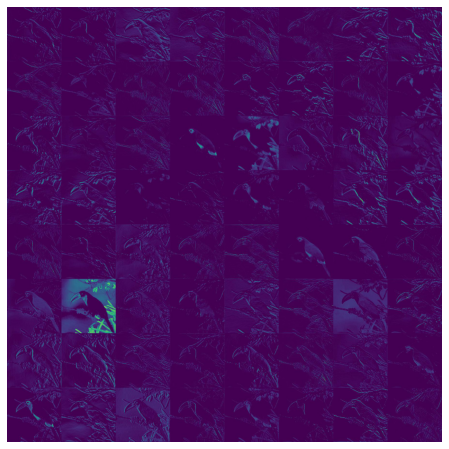

In [11]:
im = Image.open(conf.drive.__str__() + '/outputs/method_1/layer_3.jpg')
fig = plt.figure(figsize=(8, 8))
plt.imshow(im)
plt.axis('off');

# Подход №2

In [12]:
model = torchvision.models.vgg16(pretrained=True)

Создаем изображение со случайным шумом

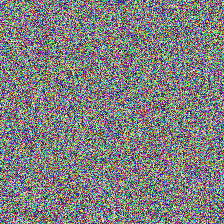

In [13]:
torch.manual_seed(conf.seed)
noise = torch.rand(size=conf.img_size, dtype=torch.float32, requires_grad=True)

torchvision.transforms.ToPILImage()(noise.detach())

In [14]:
%%writefile visualizator.py
import torch
from torch.optim.optimizer import Optimizer

import numpy as np
from tqdm.auto import tqdm


class CustomOptimizer(Optimizer):
  def __init__(self, params, lr=10):
    defaults = dict(lr=lr)
    super().__init__(params, defaults)

  def step(self, closure=None):
    loss = None
    if closure is not None:
      loss = closure()

    for group in self.param_groups:
      for p in group['params']:
        if p.grad is None:
          continue
        grad = p.grad.data
        grad /= torch.sqrt(torch.mean(torch.square(grad))) + 1e-5
        state = self.state[p]
        
        if len(state) == 0:
          state['step'] = 0

        p.data.add_(grad, alpha=group['lr'])
        state['step'] += 1
    return loss


def compute_loss(feature_extractor, input_image_, device, filter_index=0):
  activation = feature_extractor(input_image_.unsqueeze(0).to(device))
  filter_activation = activation[:, filter_index, 2:-2, 2:-2]
  return filter_activation.mean()


def visualize_filter(submodel, 
                     layer,
                     input_image,
                     device, 
                     epochs=20,
                     filter_index=0,
                     learning_rate=10):
  running_loss = list()
  input_image_ = input_image.clone().detach().requires_grad_(True)

  feature_extractor = submodel[:layer + 1]
  feature_extractor.to(device)

  optim = CustomOptimizer(params=[input_image_], lr=learning_rate)
    
  for epoch in tqdm(range(epochs)):
    optim.zero_grad()
    loss = compute_loss(feature_extractor, input_image_, device, filter_index)
    loss.backward()
    optim.step()
    running_loss.append(loss.item())
  input_image_ = deprocess_image(input_image_)
  return input_image_, running_loss

def deprocess_image(input_image_):
  input_image_ = input_image_.detach().numpy()
  input_image_ -= input_image_.mean()
  input_image_ /= input_image_.std() + 1e-5
  input_image_ *= 0.15

  # Center crop
  input_image_ = input_image_[:, 25:-25, 25:-25]

  # Clip to [0, 1]
  input_image_ += 0.5
  input_image_ = np.clip(input_image_, 0, 1)

  # Convert to RGB array
  input_image_ *= 255
  input_image_ = np.clip(input_image_, 0, 255).astype("uint8")
  return input_image_

Writing visualizator.py


In [15]:
import visualizator


layer = 19
filter_index = 34
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

  0%|          | 0/20 [00:00<?, ?it/s]

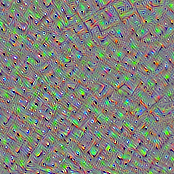

In [16]:
output_image, loss = visualizator.visualize_filter(model.features, layer, noise, device, epochs=20, filter_index=filter_index)
Image.fromarray(output_image.transpose(1, 2, 0), 'RGB')

Выведем изображения для нескольких первых фильтров определенного слоя

In [18]:
import visualizator


NCOLS = 6
MARGIN = 5
LAYER = 21
FILTERS = list(range(80))
IM_SIZE = 224 - 25*2

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [19]:
imgs = list()
for filter_index in tqdm(FILTERS, total=len(FILTERS)):
  output_image, _ = visualizator.visualize_filter(model.features, LAYER, noise, device, epochs=20, filter_index=filter_index)
  imgs.append(output_image)

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

In [20]:
nrows = len(FILTERS) // NCOLS + (len(FILTERS) % NCOLS != 0)
h = IM_SIZE*nrows + MARGIN*(nrows + 1)
w = IM_SIZE*NCOLS + MARGIN*(NCOLS + 1)
z_array = np.zeros((3, h, w), dtype='uint8')

imgs_iterator = iter(imgs)
for row in range(nrows):
    y = MARGIN + row*(IM_SIZE + MARGIN)
    for col in range(NCOLS):
        curr_array = next(imgs_iterator, None)
        if curr_array is not None:
            x = MARGIN + col*(IM_SIZE + MARGIN)
            z_array[:, y:y + IM_SIZE, x:x + IM_SIZE] = curr_array[:, :, :]
        else:
            break

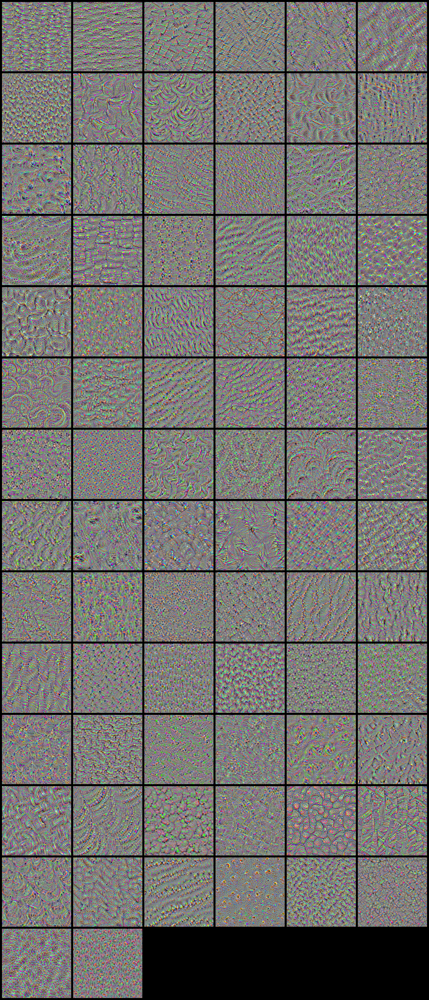

In [21]:
img = Image.fromarray(z_array.transpose(1, 2, 0), 'RGB')
img.save(f'outputs/method_2/layer_{LAYER}.bmp')
img